In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# install dependencies: (use cu100 because colab is on CUDA 10.0)
!pip install -U torch==1.4+cu100 torchvision==0.5+cu100 -f https://download.pytorch.org/whl/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
torch.__version__
!gcc --version


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 723.9 MB 24 kB/s 
     |████████████████████████████████| 4.0 MB 15.8 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.12.1+cu113
    Uninstalling torch-1.12.1+cu113:
      Successfully uninstalled torch-1.12.1+cu113
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.13.1+cu113
    Uninstalling torchvision-0.13.1+cu113:
      Successfully uninstalled torchvision-0.13.1+cu113
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.13.1 requires torch==1.12.1, but you have torch 1.4.0+cu100 which is incompatible.
torchaudio 0.12.1+cu113 requires torch==1.12.1, but you have torch 1.4.0+cu100 which

In [ ]:
# install detectron2:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/index.html
     |████████████████████████████████| 6.7 MB 798 kB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 50 kB 5.6 MB/s 
     |████████████████████████████████| 42 kB 1.2 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220512-py3-none-any.whl size=61288 sha256=ee3580953415e4f303d303f5ff201a294464e03b9fcbdd27ad6b2bac65def944
  Stored in directory: /root/.cache/pip/wheels/68/20/f9/a11a0dd63f4c13678b2a5ec488e48078756505c7777b75b29e
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31549 sha256=87d15663d589699baf67e0d39ea2aaaf78e522cb4e0d929a6077c27d68913504
  Stored in directory: /root/.cache/pip/wheels/aa/cc/ed/ca4e88beef656b01c84b9185196513ef2faf74a5a379b

In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [ ]:
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Microcontroller Detection/train_labels.csv')

df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,IMG_20181228_101826.jpg,800,600,Arduino_Nano,317,265,556,342
1,IMG_20181228_101855.jpg,800,600,Heltec_ESP32_Lora,398,243,592,382
2,IMG_20181228_101903.jpg,800,600,ESP8266,290,239,514,387
3,IMG_20181228_101915.jpg,800,600,Raspberry_Pi_3,194,200,669,531
4,IMG_20181228_102013.jpg,800,600,Arduino_Nano,383,336,591,444


In [ ]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode
import itertools
import cv2

# write a function that loads the dataset into detectron2's standard format
def get_microcontroller_dicts(csv_file, img_dir):
    df = pd.read_csv(csv_file)
    df['filename'] = df['filename'].map(lambda x: img_dir+x)

    classes = ['Raspberry_Pi_3', 'Arduino_Nano', 'ESP8266', 'Heltec_ESP32_Lora']

    df['class_int'] = df['class'].map(lambda x: classes.index(x))

    dataset_dicts = []
    for filename in df['filename'].unique().tolist():
        record = {}
        
        height, width = cv2.imread(filename).shape[:2]
        
        record["file_name"] = filename
        record["height"] = height
        record["width"] = width

        objs = []
        for index, row in df[(df['filename']==filename)].iterrows():
          obj= {
              'bbox': [row['xmin'], row['ymin'], row['xmax'], row['ymax']],
              'bbox_mode': BoxMode.XYXY_ABS,
              'category_id': row['class_int'],
              "iscrowd": 0
          }
          objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [ ]:
from detectron2.data import detection_utils as utils
import detectron2.data.transforms as T
import copy

def custom_mapper(dataset_dict):
    dataset_dict = copy.deepcopy(dataset_dict)  # it will be modified by code below
    image = utils.read_image(dataset_dict["file_name"], format="BGR")
    transform_list = [
        T.Resize((800,600)),
        T.RandomBrightness(0.8, 1.8),
        T.RandomContrast(0.6, 1.3),
        T.RandomSaturation(0.8, 1.4),
        T.RandomRotation(angle=[90, 90]),
        T.RandomLighting(0.7),
        T.RandomFlip(prob=0.4, horizontal=False, vertical=True),
    ]
    image, transforms = T.apply_transform_gens(transform_list, image)
    dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))

    annos = [
        utils.transform_instance_annotations(obj, transforms, image.shape[:2])
        for obj in dataset_dict.pop("annotations")
        if obj.get("iscrowd", 0) == 0
    ]
    instances = utils.annotations_to_instances(annos, image.shape[:2])
    dataset_dict["instances"] = utils.filter_empty_instances(instances)
    return dataset_dict

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.data import build_detection_test_loader, build_detection_train_loader

class CustomTrainer(DefaultTrainer):
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)

In [ ]:
from detectron2.data import DatasetCatalog, MetadataCatalog

classes = ['Raspberry_Pi_3', 'Arduino_Nano', 'ESP8266', 'Heltec_ESP32_Lora']

for d in ["train", "test"]:
    DatasetCatalog.register('microcontroller/' + d, lambda d=d: get_microcontroller_dicts('/content/drive/MyDrive/Colab Notebooks/Microcontroller Detection/' + d + '_labels.csv', '/content/drive/MyDrive/Colab Notebooks/Microcontroller Detection/' + d+'/'))
    MetadataCatalog.get('microcontroller/' + d).set(thing_classes=classes)
microcontroller_metadata = MetadataCatalog.get('microcontroller/train')

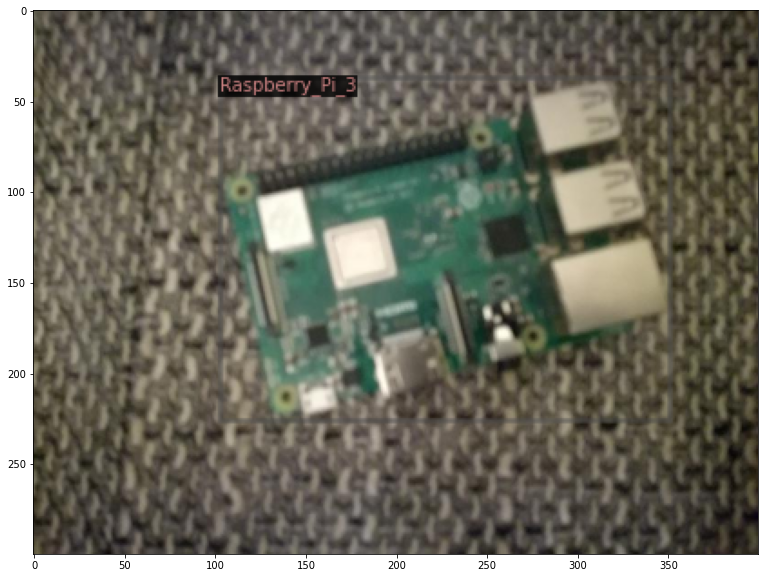

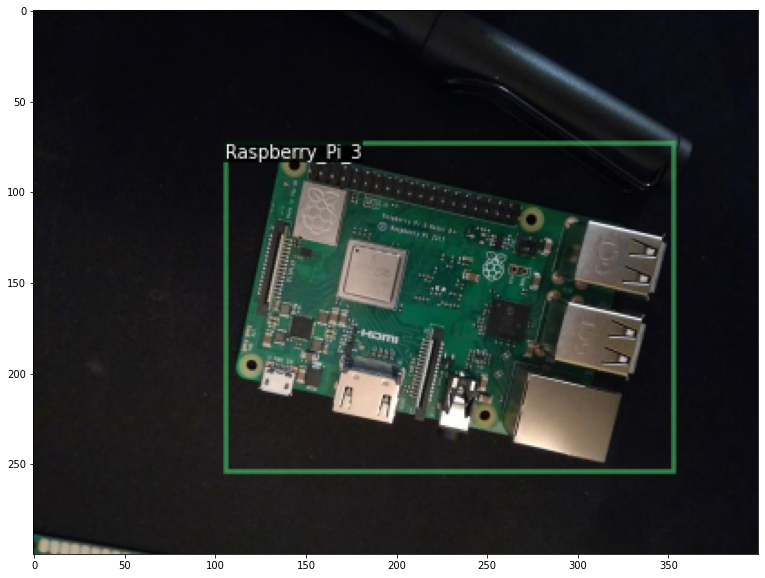

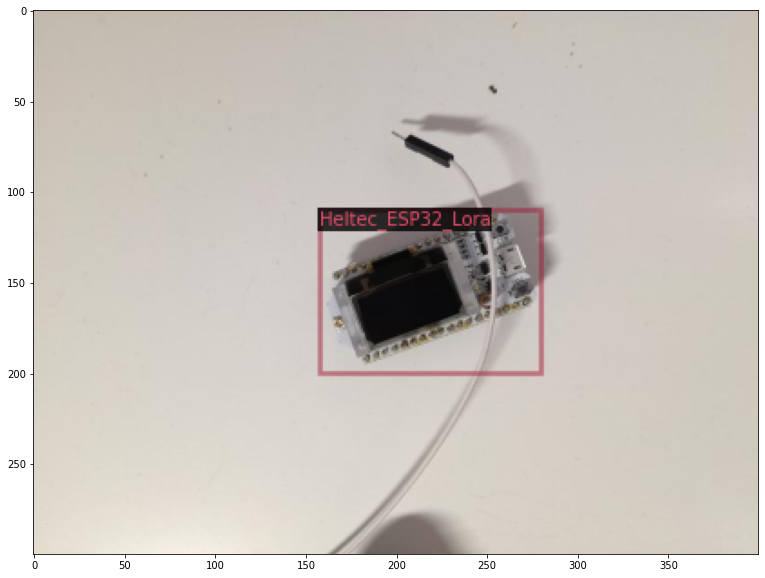

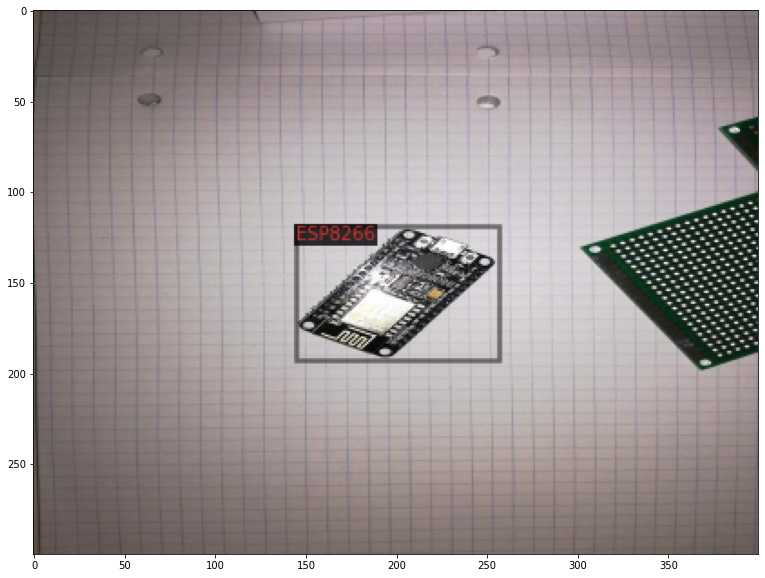

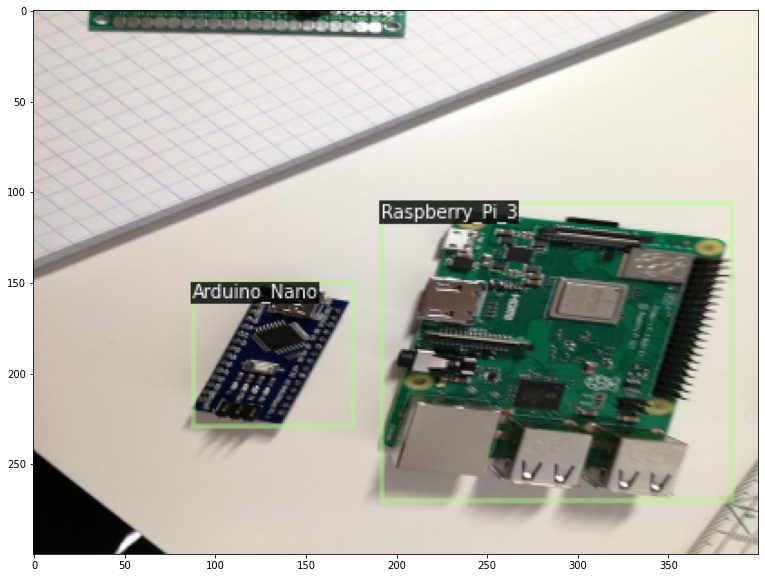

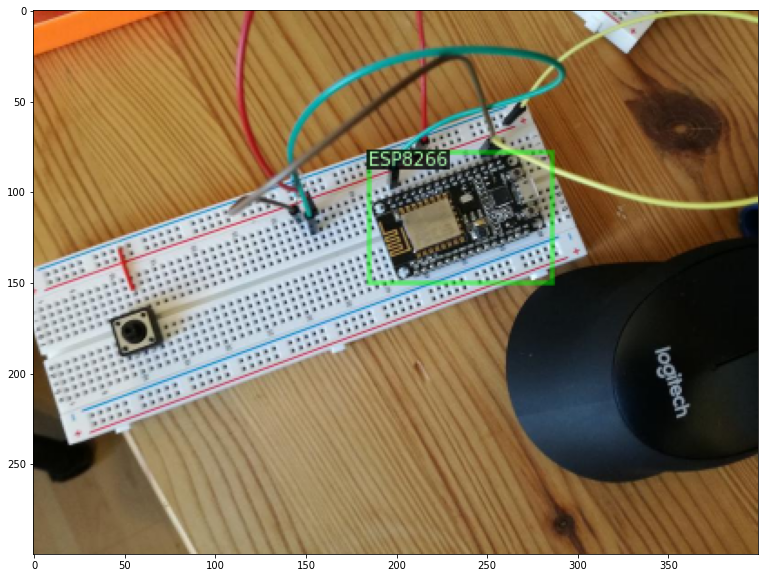

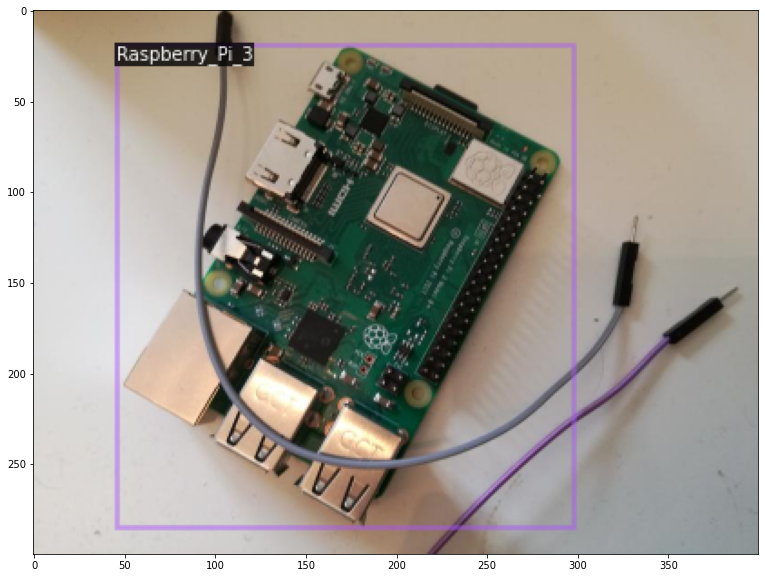

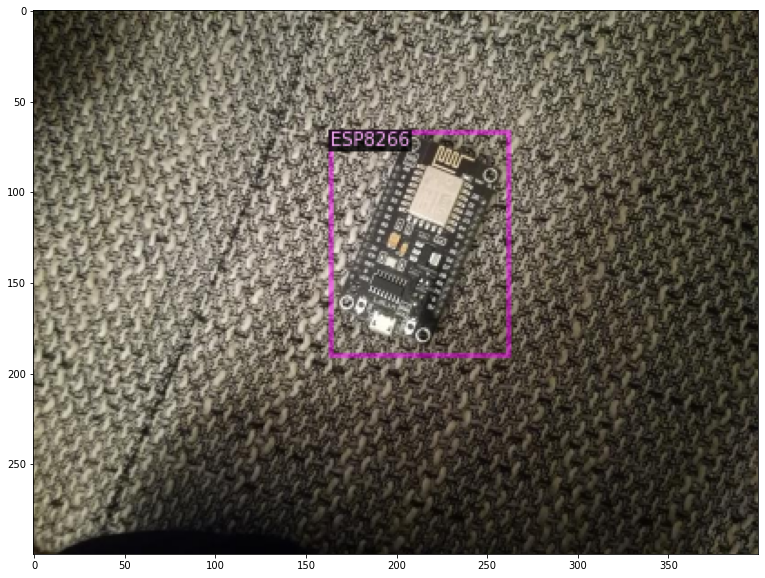

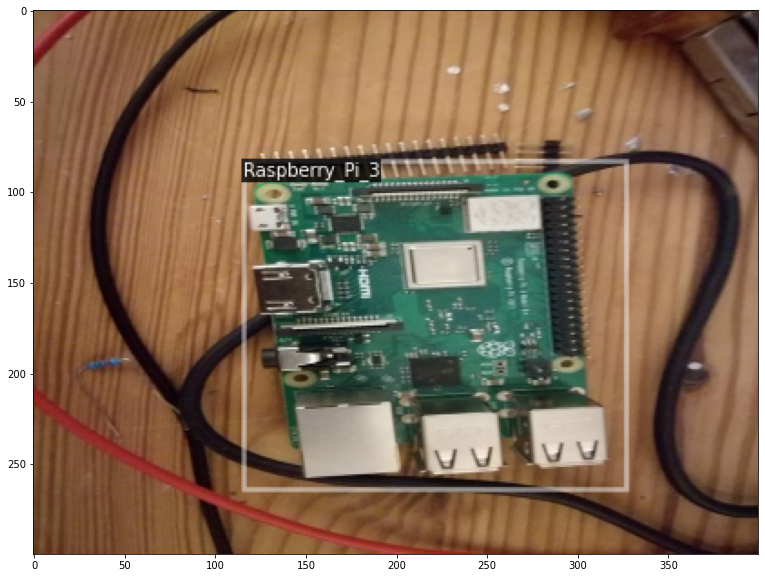

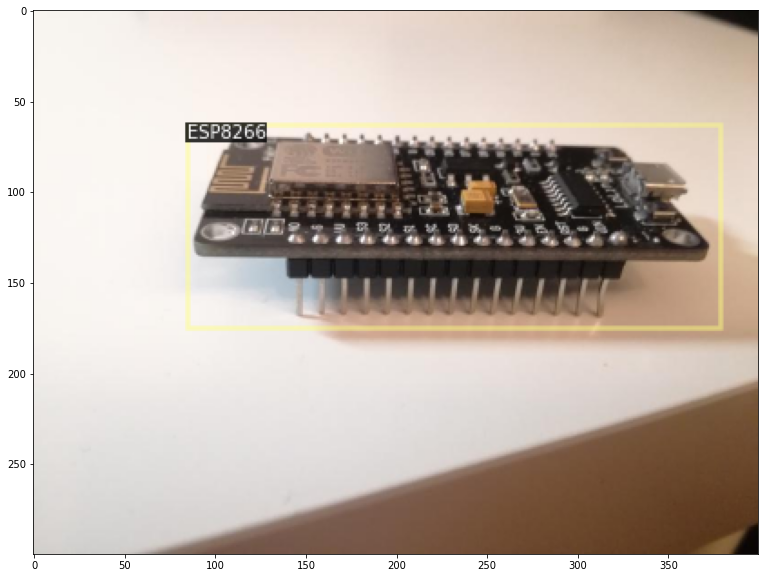

In [ ]:
#We can check if our code works correctly by plotting a few images.
import random
from detectron2.utils.visualizer import Visualizer

dataset_dicts = DatasetCatalog.get('microcontroller/train')
for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, ::-1], metadata=microcontroller_metadata, scale=0.5)
    v = v.draw_dataset_dict(d)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [ ]:
#Train model
#fine-tune a pretrained FasterRCNN object detection model to detect the different microcontrollers
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ('microcontroller/train',)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 16
cfg.SOLVER.MAX_ITER = 1000
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CustomTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[10/14 06:38:06 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f6e8b1.pkl: 243MB [00:04, 50.3MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[10/14 06:38:16 d2.engine.train_loop]: Starting training from iteration 0
[10/14 06:39:27 d2.utils.events]:  eta: 0:56:31  iter: 19  total_loss: 0.889  loss_cls: 0.718  loss_box_reg: 0.161  loss_rpn_cls: 0.008  loss_rpn_loc: 0.003  time: 3.5158  data_time: 1.2816  lr: 0.000400  max_mem: 11817M
[10/14 06:40:39 d2.utils.events]:  eta: 0:56:45  iter: 39  total_loss: 0.415  loss_cls: 0.214  loss_box_reg: 0.190  loss_rpn_cls: 0.006  loss_rpn_loc: 0.003  time: 3.5678  data_time: 1.0871  lr: 0.000799  max_mem: 11817M
[10/14 06:41:52 d2.utils.events]:  eta: 0:56:23  iter: 59  total_loss: 0.370  loss_cls: 0.153  loss_box_reg: 0.210  loss_rpn_cls: 0.005  loss_rpn_loc: 0.003  time: 3.5849  data_time: 1.0606  lr: 0.001199  max_mem: 11817M
[10/14 06:43:05 d2.utils.events]:  eta: 0:55:24  iter: 79  total_loss: 0.326  loss_cls: 0.127  loss_box_reg: 0.198  loss_rpn_cls: 0.002  loss_rpn_loc: 0.003  time: 3.6028  data_time: 1.1059  lr: 0.001598  max_mem: 11817M
[10/14 06:44:17 d2.utils.events]:  eta: 0:

In [ ]:
# Visualize augmentations
train_data_loader = trainer.build_train_loader(cfg)
data_iter = iter(train_data_loader)
batch = next(data_iter)

[10/14 07:39:41 d2.data.build]: Removed 0 images with no usable annotations. 142 images left.
[10/14 07:39:41 d2.data.common]: Serializing 142 elements to byte tensors and concatenating them all ...
[10/14 07:39:41 d2.data.common]: Serialized dataset takes 0.04 MiB
[10/14 07:39:41 d2.data.build]: Using training sampler TrainingSampler


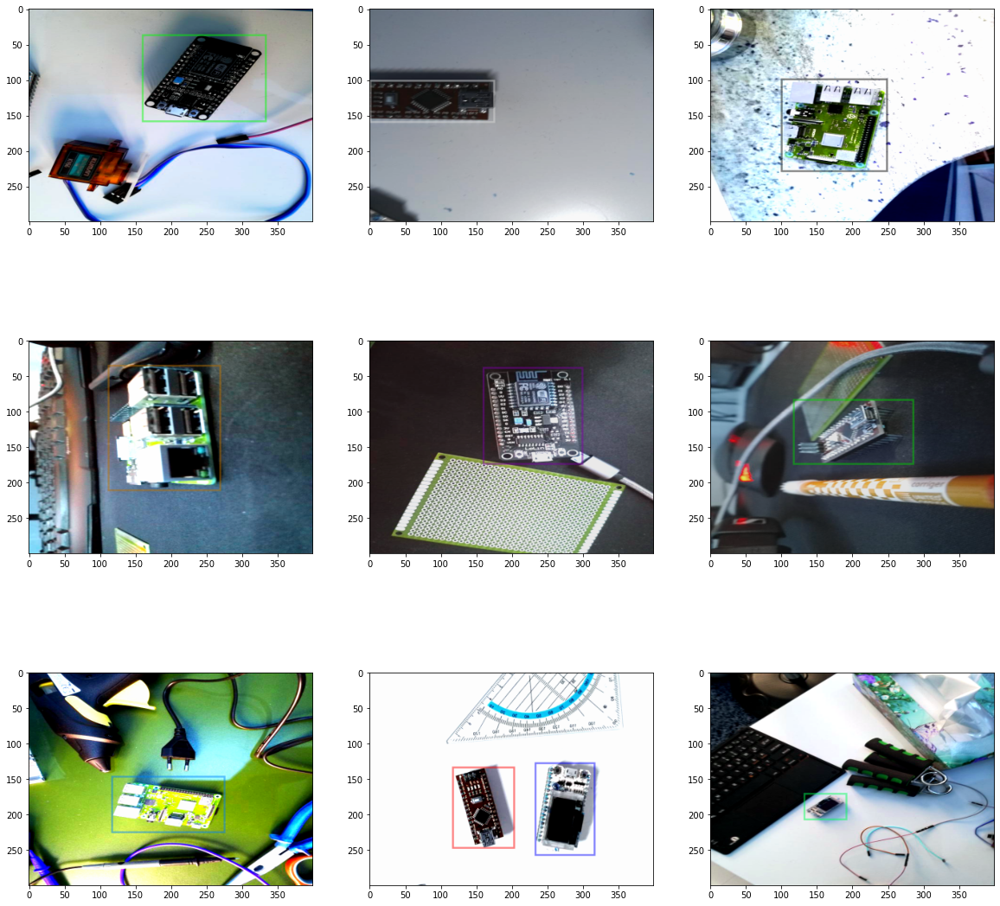

In [ ]:
rows, cols = 3, 3
plt.figure(figsize=(20,20))

for i, per_image in enumerate(batch[:int(rows*cols)]):
    
    plt.subplot(rows, cols, i+1)
    
    # Pytorch tensor is in (C, H, W) format
    img = per_image["image"].permute(1, 2, 0).cpu().detach().numpy()
    img = utils.convert_image_to_rgb(img, cfg.INPUT.FORMAT)

    visualizer = Visualizer(img, metadata=microcontroller_metadata, scale=0.5)

    target_fields = per_image["instances"].get_fields()
    labels = None
    vis = visualizer.overlay_instances(
        labels=labels,
        boxes=target_fields.get("gt_boxes", None),
        masks=target_fields.get("gt_masks", None),
        keypoints=target_fields.get("gt_keypoints", None),
    )
    plt.imshow(vis.get_image()[:, :, ::-1])

In [ ]:
# Use model for inference
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8   # set the testing threshold for this model
cfg.DATASETS.TEST = ('microcontroller/test', )
predictor = DefaultPredictor(cfg)

In [ ]:
df_test = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Microcontroller Detection/test_labels.csv')
df_test

,filename,width,height,class,xmin,ymin,xmax,ymax
0,IMG_20181228_102636.jpg,800,600,ESP8266,316,205,465,313
1,IMG_20181228_102641.jpg,800,600,Heltec_ESP32_Lora,401,251,553,405
2,IMG_20181228_102658.jpg,800,600,Arduino_Nano,184,130,618,330
3,IMG_20181228_102706.jpg,800,600,Raspberry_Pi_3,233,137,640,472
4,IMG_20181228_102745.jpg,800,600,Heltec_ESP32_Lora,195,135,609,366
5,IMG_20181228_102749.jpg,800,600,Arduino_Nano,158,179,540,372
6,IMG_20181228_102757.jpg,800,600,ESP8266,266,215,658,443


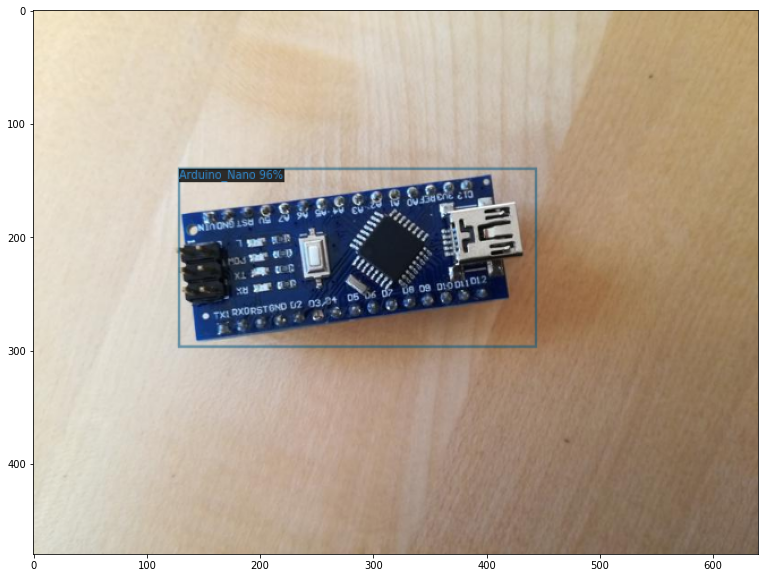

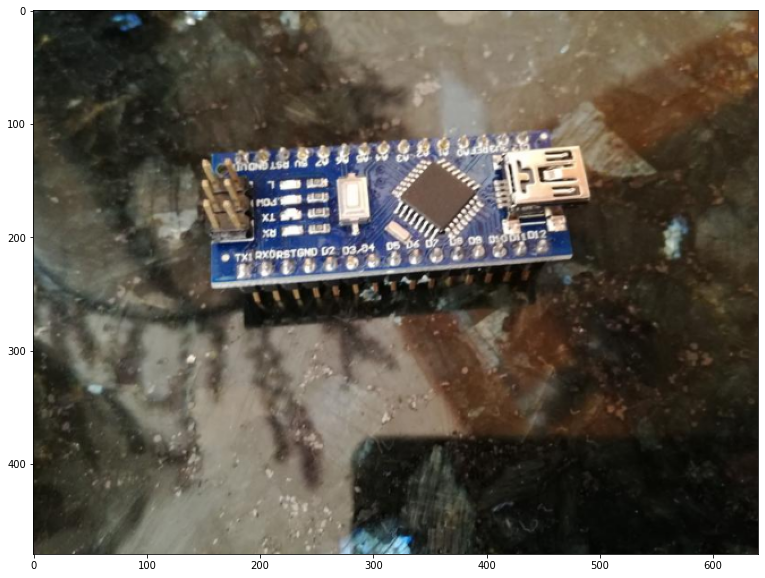

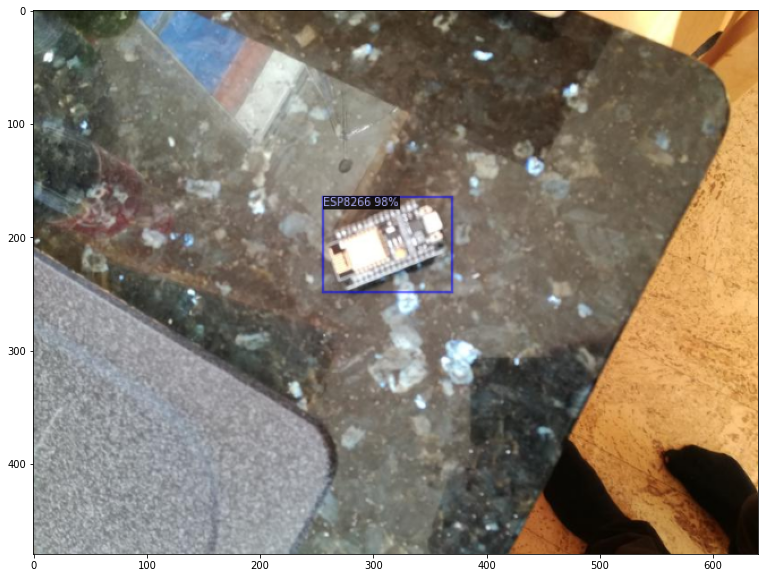

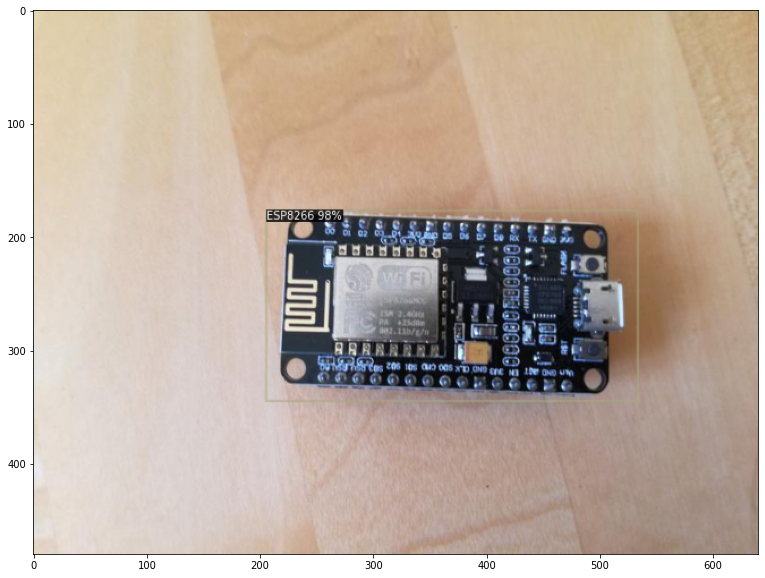

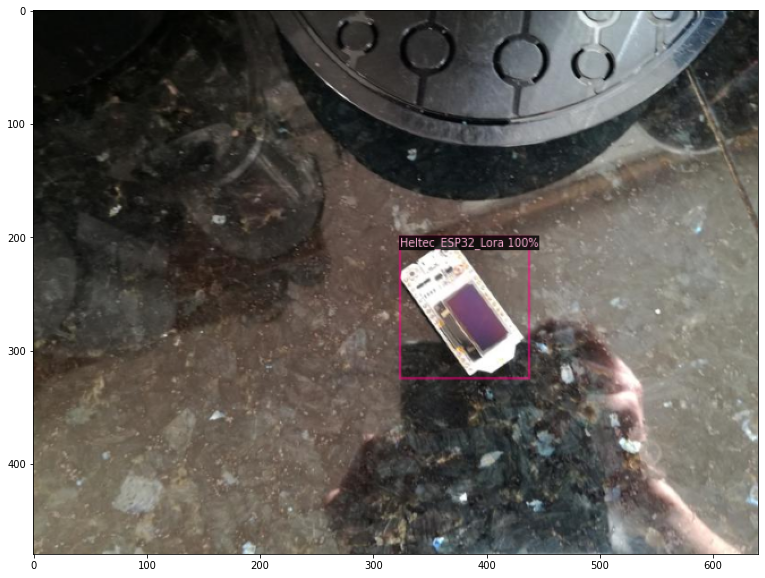

In [ ]:
from detectron2.utils.visualizer import ColorMode
import random

dataset_dicts = DatasetCatalog.get('microcontroller/test')
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=microcontroller_metadata, scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()